<a href="https://colab.research.google.com/github/priyaNingai/land-cover-classification-of-satellite-imagery-using-CNN/blob/main/Land_cover_classification_of_satellite_imagery_using_CNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#<font color = 'tomato'>Land cover classification of satellite imagery using Convolutional Neural Networks</font>

In [27]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Download Data


In [28]:
#%cd /content/drive/MyDrive

!wget http://www.ehu.eus/ccwintco/uploads/a/a3/Salinas_corrected.mat http://www.ehu.eus/ccwintco/uploads/f/fa/Salinas_gt.mat


--2022-10-09 09:22:42--  http://www.ehu.eus/ccwintco/uploads/a/a3/Salinas_corrected.mat
Resolving www.ehu.eus (www.ehu.eus)... 158.227.0.65, 2001:720:1410::65
Connecting to www.ehu.eus (www.ehu.eus)|158.227.0.65|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ehu.eus/ccwintco/uploads/a/a3/Salinas_corrected.mat [following]
--2022-10-09 09:22:42--  https://www.ehu.eus/ccwintco/uploads/a/a3/Salinas_corrected.mat
Connecting to www.ehu.eus (www.ehu.eus)|158.227.0.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 26552770 (25M)
Saving to: ‘Salinas_corrected.mat.1’

Salinas_corrected.m 100%[===================>]  25.32M   705KB/s    in 21s     

2022-10-09 09:23:04 (1.21 MB/s) - ‘Salinas_corrected.mat.1’ saved [26552770/26552770]

--2022-10-09 09:23:04--  http://www.ehu.eus/ccwintco/uploads/f/fa/Salinas_gt.mat
Connecting to www.ehu.eus (www.ehu.eus)|158.227.0.65|:80... connected.
HTTP request sent, awaiting respo

## Import Libraries

In [29]:
!pip install earthpy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
import matplotlib.pyplot as plt

import numpy as np
import earthpy.plot as ep
import seaborn as sns
import earthpy.spatial as es

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.preprocessing import minmax_scale
from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Conv1D, MaxPooling1D, Dropout, Flatten
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard

from tqdm import tqdm
from numpy.random import seed
from time import time

seed(11)

## Load Data

In [5]:
data = loadmat('Salinas_corrected.mat')['salinas_corrected']

gt = loadmat('Salinas_gt.mat')['salinas_gt']

print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands: {data.shape[-1]}')

Data Shape: (512, 217)
Number of Bands: 204


In [6]:
df = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1], -1))

df.columns = [f'band{i}' for i in range(1, df.shape[-1]+1)]

df['class'] = gt.ravel()

In [7]:
df.head()

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band196,band197,band198,band199,band200,band201,band202,band203,band204,class
0,290,381,585,1041,1316,1397,1319,1462,1643,1683,...,96,109,93,54,79,54,36,11,17,0
1,290,381,519,1041,1316,1352,1319,1462,1643,1683,...,94,111,96,56,83,56,36,11,15,0
2,290,381,585,1041,1286,1352,1300,1412,1614,1644,...,88,107,89,54,81,54,30,11,11,0
3,290,381,585,999,1316,1374,1280,1380,1584,1631,...,86,105,85,56,75,50,30,11,19,0
4,219,381,585,999,1286,1352,1261,1396,1555,1618,...,83,105,83,48,75,50,24,9,17,0


### Description of Classes

|Label |Class	|Samples|
|------|------|-------|
1|	Brocoli_green_weeds_1	|2009
2|	Brocoli_green_weeds_2	|3726
3|	Fallow	|1976
4	|Fallow_rough_plow|	1394
5	|Fallow_smooth	|2678
6|	Stubble	|3959
7	|Celery	|3579
8	|Grapes_untrained	|11271
9	|Soil_vinyard_develop|	6203
10|	Corn_senesced_green_weeds|	3278
11|	Lettuce_romaine_4wk	|1068
12|	Lettuce_romaine_5wk	|1927
13|	Lettuce_romaine_6wk	|916
14|	Lettuce_romaine_7wk	|1070
15|	Vinyard_untrained|	7268
16|	Vinyard_vertical_trellis|	1807



## Data Visualization

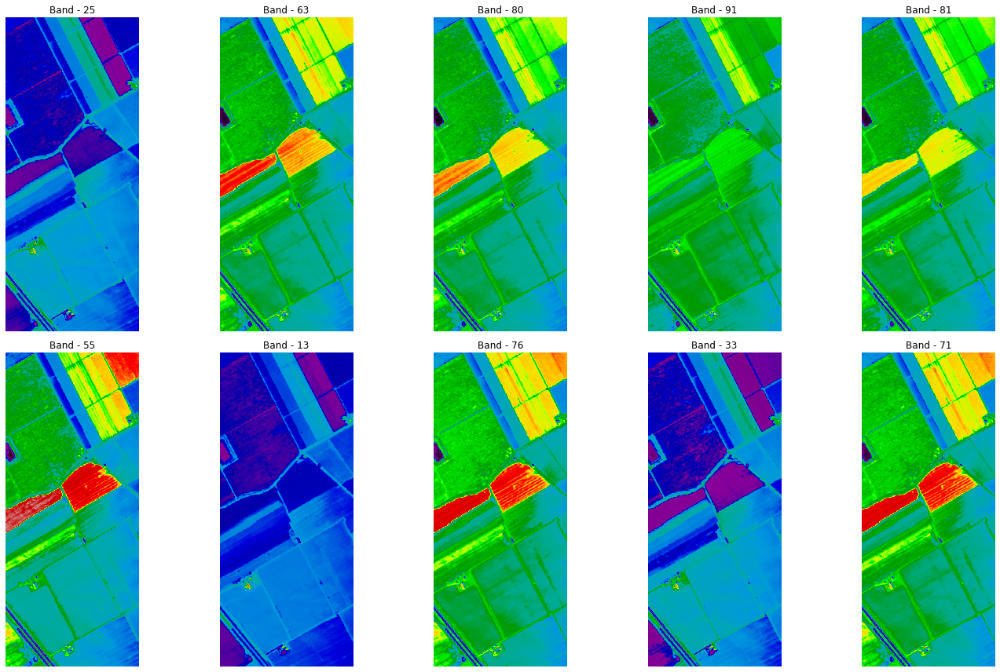

In [8]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='nipy_spectral')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()


## RGB Composite Image

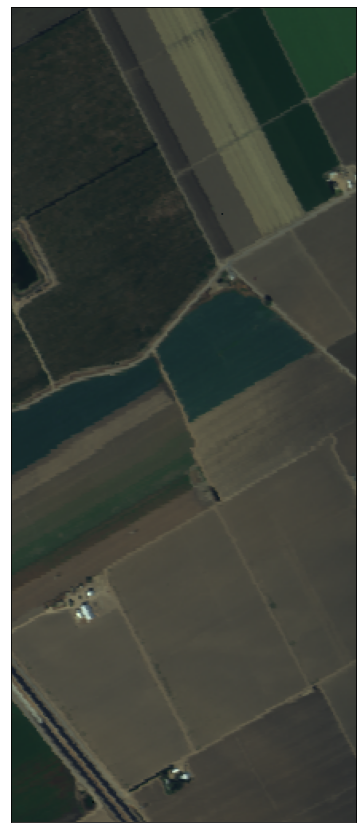

In [9]:
mdata = np.moveaxis(data, -1, 0)

ep.plot_rgb(mdata, (29, 19, 9), figsize=(15, 15)) 

plt.show()

## GroundTruth Visualizaation

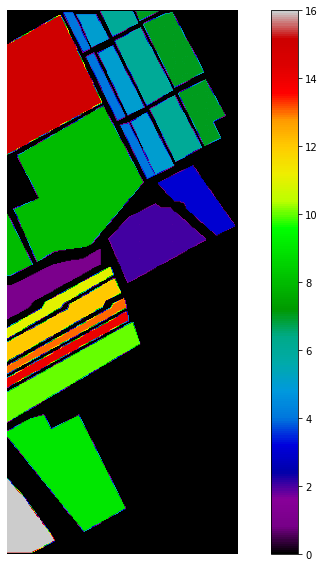

In [10]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='nipy_spectral')
  plt.colorbar()
  plt.axis('off')
  plt.show()

plot_data(gt)

## Scaling Data

In [11]:
t_df = df[df['class']!=0]

ind = ['band'+str(i) for i in range(1, t_df.shape[-1])]

X = t_df.loc[:, ind]

y = to_categorical(t_df.loc[:, 'class'])

X_scaled = minmax_scale(X, axis = 0);

X_scaled.shape, y.shape

((54129, 204), (54129, 17))

## Split Data 

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y,
                                                    stratify=y, 
                                                    test_size=0.30)
print(f"X_train: {X_train.shape}\ny_train: {y_train.shape}\nX_test: {X_test.shape}\ny_test: {y_test.shape}") 

X_train: (37890, 204)
y_train: (37890, 17)
X_test: (16239, 204)
y_test: (16239, 17)


## Build CNN

In [13]:
ip_shape = X_train[1].shape

n_outputs = y_train.shape[1]

X_train[1].ravel().shape

(204,)

In [ ]:
X_train = X_train.reshape(-1, 204, 1)
X_test = X_test.reshape(-1, 204, 1)


In [14]:
model = Sequential(name = 'Salinas_CNN')

model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu', input_shape =(ip_shape[0],1), name = 'Layer1'))
model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu' , name = 'Layer2'))
model.add(Conv1D(filters = 64, kernel_size = 3, activation ='relu' , name = 'Layer3'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer1'))
model.add(Dropout(0.4, name = 'Dropout1'))

model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer4'))
model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer5'))
model.add(Conv1D(filters = 32, kernel_size = 3, activation ='relu', name = 'Layer6'))

model.add(MaxPooling1D(pool_size = 2, name = 'MaxPooling_Layer2'))
model.add(Dropout(0.4, name = 'Dropout2'))

model.add(Flatten(name = 'Flatten'))

model.add(Dense(25, activation='relu', name = 'DenseLayer'))

model.add(Dense(n_outputs, activation='softmax', name = 'OutputLayer'))


model.summary()

Model: "Salinas_CNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Layer1 (Conv1D)             (None, 202, 64)           256       
                                                                 
 Layer2 (Conv1D)             (None, 200, 64)           12352     
                                                                 
 Layer3 (Conv1D)             (None, 198, 64)           12352     
                                                                 
 MaxPooling_Layer1 (MaxPooli  (None, 99, 64)           0         
 ng1D)                                                           
                                                                 
 Dropout1 (Dropout)          (None, 99, 64)            0         
                                                                 
 Layer4 (Conv1D)             (None, 97, 32)            6176      
                                                       

In [15]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [17]:
early_stop = EarlyStopping(monitor = 'val_loss',
                            mode = 'min',
                            min_delta = 0,
                            patience = 10,
                            restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Salinas_Model.h5', 
                             monitor = 'val_loss', 
                             mode ='min', 
                             save_best_only = True)

tensorboard = TensorBoard(log_dir='SA_logs/{}'.format(time()))

In [18]:
hist = model.fit(X_train, 
                       y_train, 
                       epochs = 100, 
                       batch_size = 256 , 
                       validation_data = (X_test, y_test), 
                       callbacks=[early_stop,
                                  checkpoint,
                                  tensorboard])
 

Epoch 1/100
149/149 [==============================] - 15s 27ms/step - loss: 1.3453 - accuracy: 0.5296 - val_loss: 0.5548 - val_accuracy: 0.7880
Epoch 2/100
149/149 [==============================] - 2s 15ms/step - loss: 0.5066 - accuracy: 0.7881 - val_loss: 0.3950 - val_accuracy: 0.8426
Epoch 3/100
149/149 [==============================] - 2s 16ms/step - loss: 0.4083 - accuracy: 0.8300 - val_loss: 0.4011 - val_accuracy: 0.8189
Epoch 4/100
149/149 [==============================] - 2s 15ms/step - loss: 0.3717 - accuracy: 0.8461 - val_loss: 0.3426 - val_accuracy: 0.8335
Epoch 5/100
149/149 [==============================] - 2s 16ms/step - loss: 0.3498 - accuracy: 0.8537 - val_loss: 0.3472 - val_accuracy: 0.8521
Epoch 6/100
149/149 [==============================] - 2s 14ms/step - loss: 0.3400 - accuracy: 0.8568 - val_loss: 0.2962 - val_accuracy: 0.8899
Epoch 7/100
149/149 [==============================] - 2s 17ms/step - loss: 0.3183 - accuracy: 0.8678 - val_loss: 0.2798 - val_accuracy

In [20]:
%load_ext tensorboard

%tensorboard --logdir SA_logs/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 701), started 0:00:17 ago. (Use '!kill 701' to kill it.)

<IPython.core.display.Javascript object>

In [21]:
hist = pd.DataFrame(data= hist.history)

fig = go.Figure()

fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))

fig.show()

In [22]:
loss, acc = model.evaluate(X_test, y_test)

508/508 [==============================] - 2s 4ms/step - loss: 0.1854 - accuracy: 0.9278


In [23]:
print(f"Accuracy: {acc*100}\nLoss: {loss}")

Accuracy: 92.78280735015869
Loss: 0.18538016080856323


In [24]:
from tensorflow.keras.models import load_model

model = load_model("Salinas_Model.h5")

In [25]:
pred = np.argmax(model.predict(X_test), axis=1)

# Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
      target_names = ['1.Brocoli_green_weeds_1', '2.Brocoli_green_weeds_2',
                      '3.Fallow',
                      '4.Fallow_rough_plow',
                      '5.Fallow_smooth',
                      '6.Stubble',
                      '7.Celery',
                      '8.Grapes_untrained',
                      '9.Soil_vinyard_develop',
                      '10.Corn_senesced_green_weeds',
                      '11.Lettuce_romaine_4wk',
                      '12.Lettuce_romaine_5wk',
                      '13.Lettuce_romaine_6wk',
                      '14.Lettuce_romaine_7wk',
                      '15.Vinyard_untrained',
                      '16.Vinyard_vertical_trellis']))

                              precision    recall  f1-score   support

     1.Brocoli_green_weeds_1       1.00      1.00      1.00       600
     2.Brocoli_green_weeds_2       1.00      1.00      1.00      1120
                    3.Fallow       0.98      0.97      0.98       598
         4.Fallow_rough_plow       1.00      0.99      0.99       424
             5.Fallow_smooth       0.99      0.98      0.99       811
                   6.Stubble       1.00      1.00      1.00      1188
                    7.Celery       1.00      1.00      1.00      1070
          8.Grapes_untrained       0.89      0.81      0.85      3713
      9.Soil_vinyard_develop       1.00      0.99      0.99      1878
10.Corn_senesced_green_weeds       0.95      0.97      0.96       960
      11.Lettuce_romaine_4wk       0.98      0.98      0.98       321
      12.Lettuce_romaine_5wk       1.00      0.98      0.99       589
      13.Lettuce_romaine_6wk       0.99      0.95      0.97       287
      14.Lettuce_ro

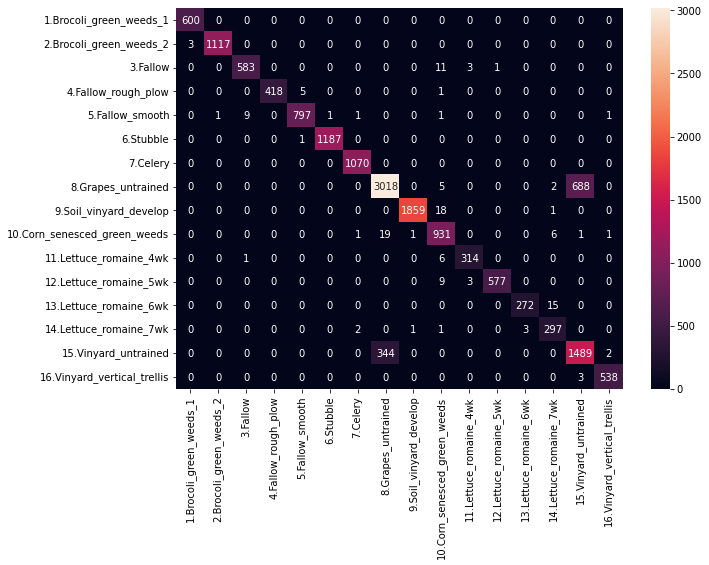

In [26]:
plt.figure(figsize = (10,7))

classes = ['1.Brocoli_green_weeds_1', '2.Brocoli_green_weeds_2',
                      '3.Fallow',
                      '4.Fallow_rough_plow',
                      '5.Fallow_smooth',
                      '6.Stubble',
                      '7.Celery',
                      '8.Grapes_untrained',
                      '9.Soil_vinyard_develop',
                      '10.Corn_senesced_green_weeds',
                      '11.Lettuce_romaine_4wk',
                      '12.Lettuce_romaine_5wk',
                      '13.Lettuce_romaine_6wk',
                      '14.Lettuce_romaine_7wk',
                      '15.Vinyard_untrained',
                      '16.Vinyard_vertical_trellis']

mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat, index = classes, columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()



---

